 Load data

In [35]:
import pandas as pd
import numpy as np

df_Web = pd.read_csv(
    '/Users/chima/SecurITe_project/MachineLearningCVE/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv',
    encoding='latin1'
)
df_Web.columns = df_Web.columns.str.strip()
df_Web.shape

(170366, 79)

The dataset contains 170,366 rows and 79 columns.

In [36]:
# ---- Cell 2: Fix the broken dash in Label (encoding-proof, no guessing) ----
# Instead of guessing which special character the dash became, we match
# on the surrounding text and replace it with a plain hyphen. Works no
# matter what the broken character actually is.


### Label Cleaning

In [37]:
df_Web['Label'] = df_Web['Label'].str.replace(
    r'^Web Attack.*Brute Force$', 'Web Attack - Brute Force', regex=True
)
df_Web['Label'] = df_Web['Label'].str.replace(
    r'^Web Attack.*XSS$', 'Web Attack - XSS', regex=True
)
df_Web['Label'] = df_Web['Label'].str.replace(
    r'^Web Attack.*Sql Injection$', 'Web Attack - Sql Injection', regex=True
)

df_Web['Label'].unique()

array(['BENIGN', 'Web Attack - Brute Force', 'Web Attack - XSS',
       'Web Attack - Sql Injection'], dtype=object)

###  Preview

In [38]:

pd.set_option("display.max_columns", None)
df_Web.head(10)


,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,389,113095465,48,24,9668,10012,403,0,201.416667,203.548293,923,316,417.166667,231.080951,1.740123e+02,0.636630,1.592894e+06,4.597265e+06,16500000,3,113000000,2.406286e+06,5.491986e+06,16500000,3,113000000,4917177.522,7.084368e+06,16500000,3,1,0,0,0,1536,768,0.424420,0.212210,0,923,275.109589,233.833248,54677.987820,0,1,0,0,1,0,0,0,0,278.930556,201.416667,417.166667,1536,0,0,0,0,0,0,48,9668,24,10012,571,2079,23,32,203985.500,5.758373e+05,1629110,379,13800000.0,4.277541e+06,16500000,6737603,BENIGN
1,389,113473706,68,40,11364,12718,403,0,167.117647,171.919413,1139,126,317.950000,208.261294,2.122254e+02,0.951762,1.060502e+06,3.813685e+06,16500000,2,113000000,1.693637e+06,4.719143e+06,16500000,2,113000000,2908399.744,5.922355e+06,16500000,3,1,0,0,0,2176,1280,0.599258,0.352505,0,1139,224.633027,198.999612,39600.845570,0,1,0,0,1,0,0,0,0,226.712963,167.117647,317.950000,2176,0,0,0,0,0,0,68,11364,40,12718,390,2081,39,32,178326.875,5.034269e+05,1424245,325,13800000.0,4.229413e+06,16500000,6945512,BENIGN
2,0,119945515,150,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000e+00,1.250568,8.050035e+05,5.277837e+06,60100000,0,120000000,8.050035e+05,5.277837e+06,60100000,0,0,0.000,0.000000e+00,0,0,0,0,0,0,0,0,1.250568,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,150,0,0,0,-1,-1,0,0,6909777.333,1.170000e+07,20400000,6,24400000.0,2.430000e+07,60100000,5702188,BENIGN
3,443,60261928,9,7,2330,4221,1093,0,258.888889,409.702161,1460,0,603.000000,653.594166,1.087088e+02,0.265508,4.017462e+06,1.550000e+07,60000000,1,60300000,7.532741e+06,2.120000e+07,60000000,311,211947,35324.500,2.750433e+04,57109,48,0,0,0,0,192,152,0.149348,0.116160,0,1460,385.352941,532.094087,283124.117600,0,0,0,1,0,0,0,0,0,409.437500,258.888889,603.000000,192,0,0,0,0,0,0,9,2330,7,4221,8192,513,8,20,0.000,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
4,53,269,2,2,102,322,51,51,51.000000,0.000000,161,161,161.000000,0.000000,1.576208e+06,14869.888480,8.966667e+01,1.483790e+02,261,4,4,4.000000e+00,0.000000e+00,4,4,4,4.000,0.000000e+00,4,4,0,0,0,0,64,64,7434.944238,7434.944238,51,161,95.000000,60.249481,3630.000000,0,0,0,0,0,0,0,0,1,118.750000,51.000000,161.000000,64,0,0,0,0,0,0,2,102,2,322,-1,-1,1,32,0.000,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
5,123,30352,1,1,48,48,48,48,48.000000,0.000000,48,48,48.000000,0.000000,3.162889e+03,65.893516,3.035200e+04,0.000000e+00,30352,30352,0,0.000000e+00,0.000000e+00,0,0,0,0.000,0.000000e+00,0,0,0,0,0,0,32,32,32.946758,32.946758,48,48,48.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,1,72.000000,48.000000,48.000000,32,0,0,0,0,0,0,1,48,1,48,-1,-1,0,32,0.000,0.000000e+00,0,0,0.0,0.000000e+00,0,0,BENIGN
6

### Label counts

In [39]:

df_Web['Label'].value_counts()

Label
BENIGN                        168186
Web Attack - Brute Force        1507
Web Attack - XSS                 652
Web Attack - Sql Injection        21
Name: count, dtype: int64

In [40]:
###  Label distribution

In [41]:

df_Web['Label'].value_counts(normalize=True) * 100

Label
BENIGN                        98.720402
Web Attack - Brute Force       0.884566
Web Attack - XSS               0.382705
Web Attack - Sql Injection     0.012326
Name: proportion, dtype: float64

In [42]:
###  Negative value scan

In [43]:

numeric_cols = df_Web.select_dtypes(include=[np.number]).columns
neg_counts = (df_Web[numeric_cols] < 0).sum()
neg_counts[neg_counts > 0].sort_values(ascending=False)

Init_Win_bytes_backward    102373
Init_Win_bytes_forward      81911
Flow IAT Min                  263
Flow Duration                  11
Flow Packets/s                 11
Flow IAT Mean                  11
Flow IAT Max                   11
Flow Bytes/s                   10
dtype: int64

In [44]:
###  Rows with negatives in known bad columns

In [45]:

bad_columns_Web = ['Flow IAT Min', 'Flow Duration',
                    'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Max']
row_is_bad_negative = (df_Web[bad_columns_Web] < 0).any(axis=1)
row_is_bad_negative.sum()


np.int64(263)

In [46]:
 ### Zero flow duration

In [47]:

row_is_bad_zero_duration = (df_Web['Flow Duration'] == 0)
print("Rows with exactly zero Flow Duration:", row_is_bad_zero_duration.sum())

Rows with exactly zero Flow Duration: 135


In [48]:
###  Impossible rate check

In [49]:

row_is_bad_rate_Web = (
    (df_Web['Flow Bytes/s'] > 1e9)
    | np.isinf(df_Web['Flow Bytes/s'])
    | np.isinf(df_Web['Flow Packets/s'])
)
print("Rows with an impossible rate:", row_is_bad_rate_Web.sum())


Rows with an impossible rate: 195


In [50]:
### Combine bad row masks

In [51]:

row_is_bad_Web = (
    row_is_bad_negative
    | row_is_bad_zero_duration
    | row_is_bad_rate_Web
)
print("Total bad rows (combined, duplicates removed):", row_is_bad_Web.sum())

df_Web[row_is_bad_Web]['Label'].value_counts()

Total bad rows (combined, duplicates removed): 458


Label
BENIGN    458
Name: count, dtype: int64

In [52]:
### Inspect bad attack rows

In [53]:

bad_attack_rows = df_Web[row_is_bad_Web & (df_Web['Label'] != 'BENIGN')]

bad_attack_rows[['Label', 'Destination Port', 'Flow Duration', 'Total Fwd Packets',
                  'Total Backward Packets', 'Flow Bytes/s', 'Flow Packets/s',
                  'Flow IAT Min', 'Flow IAT Mean', 'Flow IAT Max']]

,Label,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Flow Bytes/s,Flow Packets/s,Flow IAT Min,Flow IAT Mean,Flow IAT Max


Confirmed that 0 non-BENIGN rows fall into the bad mask. All 458 corrupted rows are BENIGN, ensuring no rare attack samples are lost during removal.

In [54]:
### Check negative Flow IAT Min values 

In [55]:

df_Web[df_Web['Flow IAT Min'] < 0]['Flow IAT Min'].value_counts()

Flow IAT Min
-1     249
-2       6
-3       4
-5       2
-12      1
-11      1
Name: count, dtype: int64

In [56]:
### Separate artifact vs "real" bad attack rows

In [57]:

attack_artifact_mask = row_is_bad_Web & (df_Web['Label'] != 'BENIGN') & (df_Web['Flow Duration'] == 0)
attack_real_mask = row_is_bad_Web & (df_Web['Label'] != 'BENIGN') & (df_Web['Flow Duration'] != 0)

print("Artifact attack rows (zero duration, matches known bug):", attack_artifact_mask.sum())
print("Real-looking attack rows (only IAT Min negative):", attack_real_mask.sum())

Artifact attack rows (zero duration, matches known bug): 0
Real-looking attack rows (only IAT Min negative): 0


### Separate artifact vs "real" bad attack rows

In [58]:

bad_benign_mask = row_is_bad_Web & (df_Web['Label'] == 'BENIGN')
df_Web_clean = df_Web[~bad_benign_mask].copy()

df_Web_clean.loc[attack_artifact_mask, 'Flow Bytes/s'] = 0
df_Web_clean.loc[attack_artifact_mask, 'Flow Packets/s'] = 0

###  Sanity check

In [59]:

print("Original shape:", df_Web.shape)
print("Cleaned shape:", df_Web_clean.shape)
print(df_Web_clean['Label'].value_counts())

remaining_inf = np.isinf(df_Web_clean.select_dtypes(include=[np.number])).sum()
print("Columns that still contain infinity:\n", remaining_inf[remaining_inf > 0])

Original shape: (170366, 79)
Cleaned shape: (169908, 79)
Label
BENIGN                        167728
Web Attack - Brute Force        1507
Web Attack - XSS                 652
Web Attack - Sql Injection        21
Name: count, dtype: int64
Columns that still contain infinity:
 Series([], dtype: int64)


### Setup for feature separability

In [60]:

from sklearn.feature_selection import mutual_info_classif

benign_rows = df_Web_clean[df_Web_clean['Label'] == 'BENIGN']
attack_rows = df_Web_clean[df_Web_clean['Label'] != 'BENIGN']

numeric_columns = df_Web_clean.select_dtypes(include=[np.number]).columns.tolist()

def calculate_cohens_d(column_name, group_a, group_b):
    mean_a, mean_b = group_a[column_name].mean(), group_b[column_name].mean()
    std_a, std_b = group_a[column_name].std(), group_b[column_name].std()
    n_a, n_b = len(group_a), len(group_b)

    pooled_std = np.sqrt(((n_a - 1) * std_a**2 + (n_b - 1) * std_b**2) / (n_a + n_b - 2))

    return 0 if pooled_std == 0 else (mean_b - mean_a) / pooled_std

### Cohen's d + Mutual Info, BENIGN vs all Web Attacks combined

In [61]:

cohens_d_web = pd.Series(
    {col: calculate_cohens_d(col, benign_rows, attack_rows) for col in numeric_columns},
    name="Cohen's d"
)

X_web = df_Web_clean[numeric_columns].fillna(0)
y_web = (df_Web_clean['Label'] != 'BENIGN').astype(int)

mutual_info_web = pd.Series(
    mutual_info_classif(X_web, y_web, random_state=0),
    index=numeric_columns,
    name="Mutual Info"
)

web_comparison = pd.DataFrame({"Cohen's d": cohens_d_web, "Mutual Info": mutual_info_web})
web_comparison["abs_cohens_d"] = web_comparison["Cohen's d"].abs()
web_comparison_sorted = web_comparison.sort_values("abs_cohens_d", ascending=False).drop(columns="abs_cohens_d")
web_comparison_sorted.head(15)

,Cohen's d,Mutual Info
Init_Win_bytes_backward,2.381409,0.057570
PSH Flag Count,1.654600,0.018831
Init_Win_bytes_forward,1.592250,0.031372
Down/Up Ratio,-1.116374,0.025952
min_seg_size_forward,1.028408,0.028589
Min Packet Length,-0.851585,0.014001
Bwd Packet Length Min,-0.745277,0.011478
Fwd Packet Length Min,-0.607485,0.014342
Fwd IAT Std,0.569526,0.035326
Average Packet Size,-0.545759,0.029325


In [62]:
# ---- Cell 18: Describe by group ----
df_Web_clean.describe()
df_Web_clean[df_Web_clean['Label'] == 'BENIGN'].describe()
df_Web_clean[df_Web_clean['Label'] != 'BENIGN'].describe()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
count,2180.0,2.180000e+03,2180.000000,2180.000000,2180.000000,2180.000000,2180.000000,2180.0,2180.000000,2180.000000,2180.000000,2180.0,2180.000000,2180.000000,2180.000000,2180.000000,2.180000e+03,2.180000e+03,2.180000e+03,2180.000000,2.180000e+03,2.180000e+03,2.180000e+03,2.180000e+03,2180.000000,2.180000e+03,2.180000e+03,2.180000e+03,2.180000e+03,2180.000000,2180.0,2180.0,2180.0,2180.0,2180.000000,2180.000000,2180.000000,2180.000000,2180.0,2180.000000,2180.000000,2180.000000,2.180000e+03,2180.0,2180.0,2180.0,2180.000000,2180.000000,2180.000000,2180.0,2180.0,2180.000000,2180.000000,2180.000000,2180.000000,2180.000000,2180.0,2180.0,2180.0,2180.0,2180.0,2180.0,2180.000000,2180.000000,2180.000000,2180.000000,2180.000000,2180.000000,2180.000000,2180.0,2180.0,2180.0,2180.0,2180.0,2180.0,2180.0,2180.0,2180.0
mean,80.0,6.533719e+06,10.945413,5.281193,1820.879817,3772.894037,46.763761,0.0,14.617832,20.332799,104.116514,0.0,47.825509,35.609157,157.913522,3138.912510,1.575638e+06,2.739981e+06,4.891855e+06,113.956881,6.331574e+06,2.337676e+06,3.325271e+06,4.818894e+06,777.813761,1.946152e+06,1.244373e+05,1.273711e+05,3.097554e+05,115.129817,0.0,0.0,0.0,0.0,357.611009,176.355963,1707.982269,1430.930241,0.0,108.146330,25.568071,33.886014,1.949802e+04,0.0,0.0,0.0,0.919725,0.080275,0.072477,0.0,0.0,0.109174,26.377421,14.617832,47.825509,357.611009,0.0,0.0,0.0,0.0,0.0,0.0,10.945413,1820.879817,5.281193,3772.894037,26923.507798,24256.054128,4.102752,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.0,7.492580e+06,39.124039,20.156303,8750.555255,19951.691399,155.019923,0.0,50.109359,67.317945,515.739692,0.0,211.114301,164.272898,710.372191,15922.760179,6.053950e+05,1.028470e+06,1.610522e+06,45.535617,7.510992e+06,9.371015e+05,1.299821e+06,1.677854e+06,353.310016,8.348837e+06,5.470524e+05,5.287635e+05,1.111446e+06,984.119074,0.0,0.0,0.0,0.0,1252.132678,645.144916,12215.370185,5918.297699,0.0,518.634524,101.736499,135.492369,1.240567e+05,0.0,0.0,0.0,0.271781,0.271781,0.259336,0.0,0.0,0.311929,103.582626,50.109359,211.114301,1252.132678,0.0,0.0,0.0,0.0,0.0,0.0,39.124039,8750.555255,20.156303,19951.691399,7709.197062,10545.750858,19.709466,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,80.0,4.000000e+00,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.666629,4.000000e+00,0.000000e+00,4.000000e+00,2.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.0,0.0,0.0,0.0,32.000000,0.000000,0.404235,0.000000,0.0,0.000000,0.000000,0.000000,0.000000e+00,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,32.000000,0.0,0.0,0.0

### Correlation heatmap of candidate columns

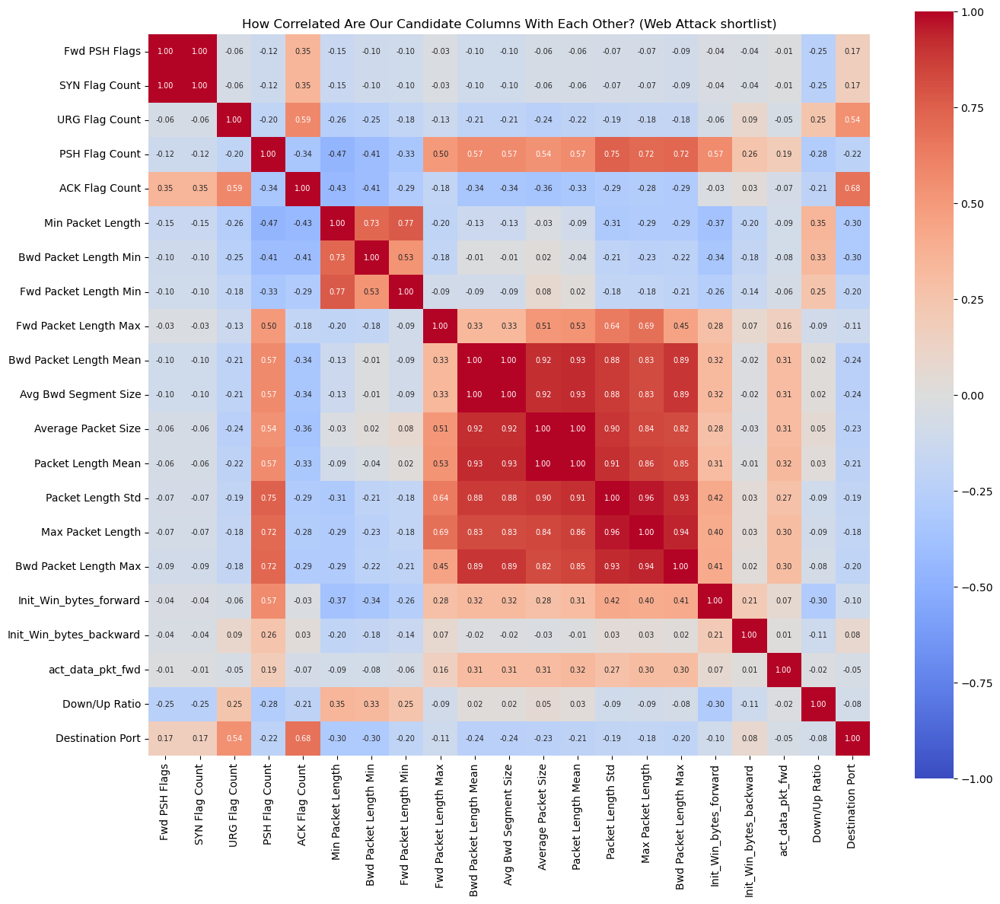

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

candidate_columns = [
    'Fwd PSH Flags', 'SYN Flag Count', 'URG Flag Count', 'PSH Flag Count',
    'ACK Flag Count', 'Min Packet Length', 'Bwd Packet Length Min',
    'Fwd Packet Length Min', 'Fwd Packet Length Max', 'Bwd Packet Length Mean',
    'Avg Bwd Segment Size', 'Average Packet Size', 'Packet Length Mean',
    'Packet Length Std', 'Max Packet Length', 'Bwd Packet Length Max',
    'Init_Win_bytes_forward', 'Init_Win_bytes_backward', 'act_data_pkt_fwd',
    'Down/Up Ratio', 'Destination Port'
]

correlation_matrix = df_Web_clean[candidate_columns].corr()

plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm',
            vmin=-1, vmax=1, square=True, annot_kws={"size": 7})
plt.title('How Correlated Are Our Candidate Columns With Each Other? (Web Attack shortlist)')
plt.tight_layout()
plt.show()

Perfect Redundant Pairs where the r =1 :
Fwd PSH Flags and SYN Flag Count
Bwd Packet Length Mean and Avg Bwd Segment Size
Average Packet Size and Packet Length Mean

Highly Multicollinear Feature Clusters r >= 0.85
Packet Length Mean, Packet Length Std, Max Packet Length, and Bwd Packet Length Max

Down/Up Ratio & Destination Port: Weakly correlated
Init_Win_bytes_backward: Shows very weak correlation

### Destination port distribution

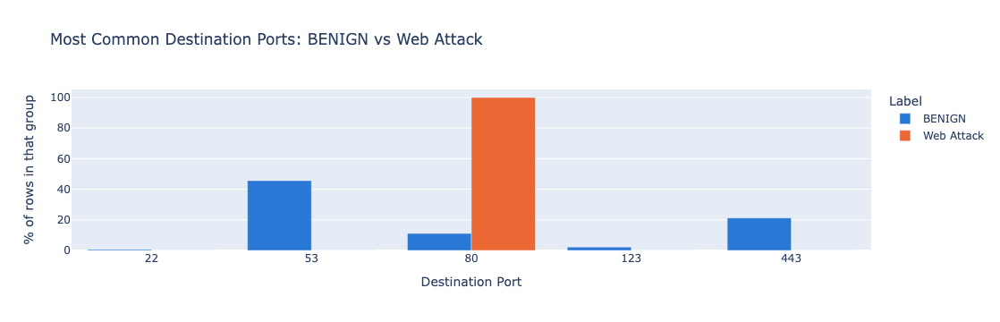

In [64]:

import plotly.express as px

colors = {'BENIGN': '#2a78d6', 'Web Attack': '#eb6834'}

top_ports_benign = benign_rows['Destination Port'].astype(int).value_counts().head(5)
top_ports_attack = attack_rows['Destination Port'].astype(int).value_counts().head(5)

ports_to_show = sorted(set(top_ports_benign.index) | set(top_ports_attack.index))

records = []
for label, group in [('BENIGN', benign_rows), ('Web Attack', attack_rows)]:
    counts = group['Destination Port'].astype(int).value_counts(normalize=True)
    percents = counts.reindex(ports_to_show).fillna(0) * 100
    for port, pct in percents.items():
        records.append({'Label': label, 'Port': str(port), 'Percent': float(pct)})

port_df = pd.DataFrame(records)

fig1 = px.bar(port_df, x='Port', y='Percent', color='Label', barmode='group',
              color_discrete_map=colors,
              title='Most Common Destination Ports: BENIGN vs Web Attack')
fig1.update_layout(xaxis_title='Destination Port', yaxis_title='% of rows in that group')
fig1.show()

Every single Web Attack row in your file is targeting port 80.
(BENIGN) are spread across multiple ports.

In [65]:
# ---- Cell 21: Colors for the 3 individual Web Attack sub-types ----
df_Web_clean['Label'].unique()

colors_detailed = {
    'BENIGN': '#2a78d6',
    'Web Attack - Brute Force': '#eb6834',
    'Web Attack - XSS': '#c0392b',
    'Web Attack - Sql Injection': '#8e44ad'
}


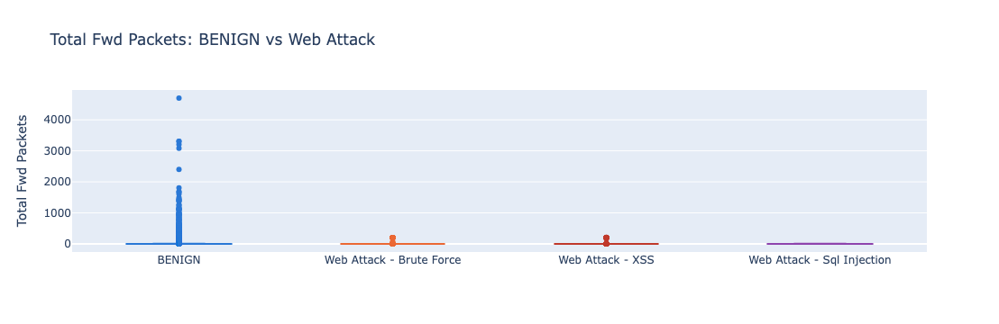

In [66]:
#  Total Fwd Packets boxplot
fig2 = px.box(df_Web_clean, x='Label', y='Total Fwd Packets', color='Label',
              color_discrete_map=colors_detailed, points='outliers',
              title='Total Fwd Packets: BENIGN vs Web Attack')
fig2.update_layout(xaxis_title='', yaxis_title='Total Fwd Packets', showlegend=False)
fig2.show()

Total Fwd Packets on its own is not a strong feature for separating Web Attacks from BENIGN.
BENIGN traffic has huge variety in packet counts
All three Web Attack types cluster tightly near 0

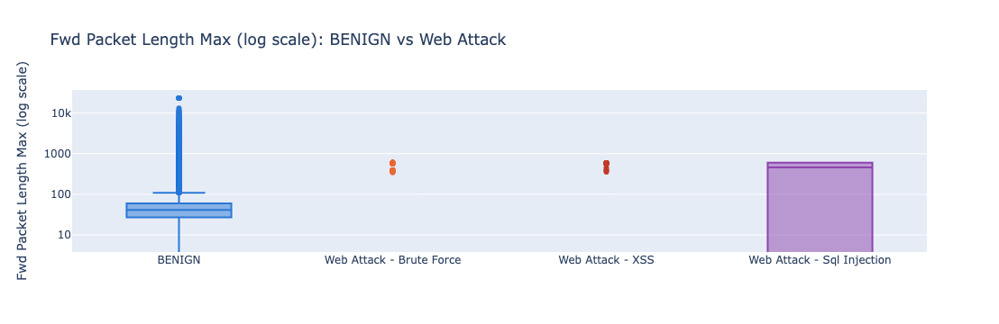

In [67]:
# Fwd Packet Length Max boxplot (log scale)
fig3 = px.box(df_Web_clean, x='Label', y='Fwd Packet Length Max', color='Label',
              color_discrete_map=colors_detailed, log_y=True, points='outliers',
              title='Fwd Packet Length Max (log scale): BENIGN vs Web Attack')
fig3.update_layout(xaxis_title='', yaxis_title='Fwd Packet Length Max (log scale)', showlegend=False)
fig3.show()


BENIGN has a wide range
Web Attack – Brute Force and XSS show up as just a few individual dot


In [68]:
# Flow Duration boxplot (log scale) 
fig4 = px.box(df_Web_clean, x='Label', y='Flow Duration', color='Label',
              color_discrete_map=colors_detailed, log_y=True, points='outliers',
              title='Flow Duration (log scale): BENIGN vs Web Attack')
fig4.update_layout(xaxis_title='', yaxis_title='Flow Duration in microseconds (log scale)', showlegend=False)
fig4.show()


BENIGN has a very wide, spread-out box
Web Attack – Brute Force and XSS show up mostly as scattered dots rather than a proper box, clustered in two separate bands
Unlike your Fwd Packet Length Max chart here Flow Duration doesn't separate attacks from BENIGN cleanly

In [69]:
# ---- Cell 25: Save cleaned file ----
df_Web_clean.to_csv('/Users/chima/SecurITe_project/Thursday_Web_clean.csv', index=False)